<a href="https://colab.research.google.com/github/sahilyousafp/Sahils/blob/main/EnvData_Day_02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Satellite Image Segmentation**

Intro to ground imagery semantics including:

*   Image Analysis Tools
*   Google Earth API
*   Extract satellite images based on location
*   Extract Geojson data based on location
*   Image segmentation and classification





In [ ]:
# Step 1: Install OpenCV
!pip install opencv-python-headless

Saving map_1.png to map_1 (46).png


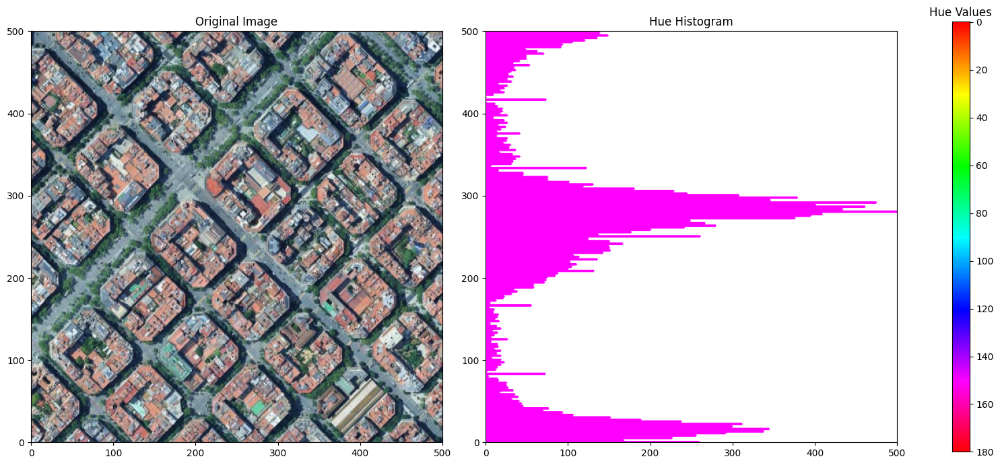

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files

# Upload and Read Image
uploaded = files.upload()
image_path = list(uploaded.keys())[0]

# Load the image in OpenCV
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Resize Image to 500x500 for Consistency
image_rgb = cv2.resize(image_rgb, (500, 500))

# Convert image to HSV color space
image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Extract the HUE channel (First channel in HSV)
hue_channel = image_hsv[:, :, 0]

# Calculate Histogram for Hue channel (normalize for better visualization)
hist_hue = cv2.calcHist([hue_channel], [0], None, [180], [0, 180])
hist_hue = hist_hue / hist_hue.max() * 500  # Scale histogram to fit in 500px space

# Create a smooth vertical color legend (500x20 to match fixed height)
hue_legend = np.zeros((500, 20, 3), dtype=np.uint8)  # Set height to 500px
for h in range(500):  # Iterate through 500 rows
    hue_value = int((h / 500) * 180)  # Map to Hue range 0-180
    hue_legend[h, :] = (hue_value, 255, 255)  # Fill with color

# Convert to RGB for visualization
hue_legend_rgb = cv2.cvtColor(hue_legend, cv2.COLOR_HSV2RGB)

# Create a blank 500x500 image for Histogram
hist_canvas = np.ones((500, 500, 3), dtype=np.uint8) * 255  # White background
for i in range(180):
    cv2.line(hist_canvas, (0, int(i / 180 * 500)),
             (int(hist_hue[i][0]), int(i / 180 * 500)), (255, 0, 255), 2) # color display, line thickness

# Plot Everything in Fixed 500x500 Bounding Boxes
fig, axes = plt.subplots(1, 3, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1, 0.1]})

# Show Original Image (Fixed Size)
axes[0].imshow(image_rgb)
axes[0].set_title("Original Image")
axes[0].set_xlim([0, 500])
axes[0].set_ylim([0, 500])
axes[0].axis("on")

# Show Histogram Canvas (Fixed Size)
axes[1].imshow(hist_canvas)
axes[1].set_title("Hue Histogram")
axes[1].set_xlim([0, 500])
axes[1].set_ylim([0, 500])
axes[1].axis("on")

# Show Hue Color Legend (Fixed Size)
axes[2].imshow(hue_legend_rgb)
axes[2].set_title("Hue Values")

# Add y-axis ticks and labels to the right side of the legend
y_ticks = np.linspace(0, 500, 10)  # 10 tick positions
y_labels = np.linspace(0, 180, 10).astype(int)  # 10 labels from 0 to 180

axes[2].set_yticks(y_ticks)
axes[2].set_yticklabels(y_labels)
# Turn off left ticks and turn on right ticks
axes[2].tick_params(left=False, labelleft=False, right=True, labelright=True)

# Remove other axis elements but keep the right y-axis
axes[2].set_xticks([])

plt.tight_layout()
plt.show()

**Open Street Maps**


> Install dendencies



In [ ]:
# Colab-Compatible Satellite Image Download
# This script uses staticmap library to download satellite images without needing Chrome

# Step 1: Install required packages
!pip install staticmap
!pip install Pillow
!pip install requests

**OSM**


> get satellite images based on longitude, latitude and size




Using zoom level 19 to approximate 256×256 meters


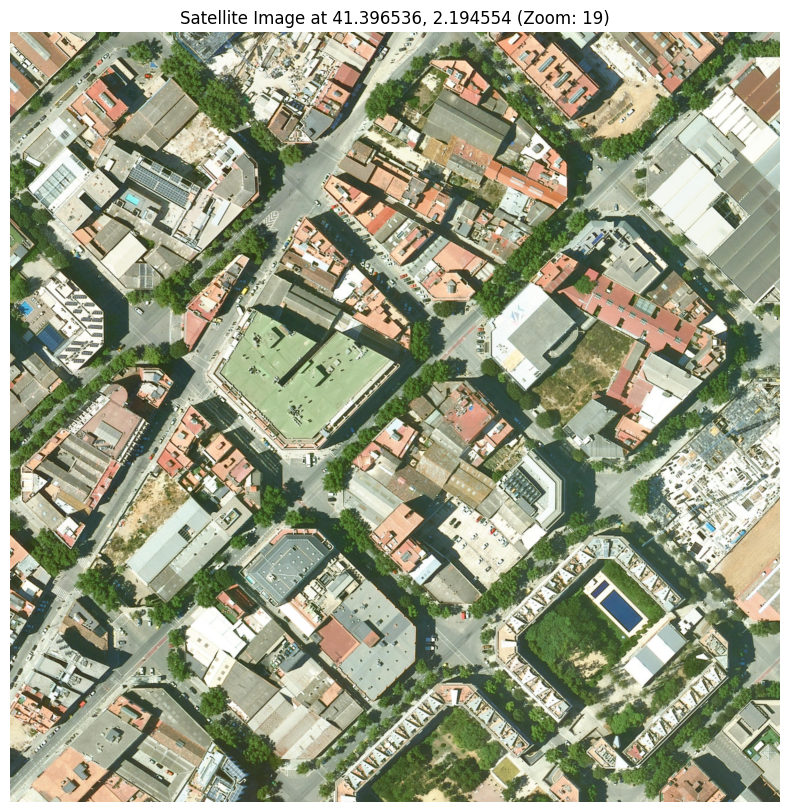

Image saved to barcelona_256m.png
Actual approximate physical dimensions: 458.7m × 458.7m
Image resolution: 2048×2048 pixels
Approximate ground resolution: 0.22 meters per pixel


In [ ]:
"""
ESRI Satellite Image Download Script
------------------------------------
This script downloads high-quality satellite imagery directly from ESRI's World Imagery
service for any location on Earth. It allows you to specify the exact physical size
of the area you want to capture and the resolution of the output image.
"""

# Import required libraries
import io
import requests
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import math

def calculate_zoom_for_physical_size(lat, physical_size_meters, width_pixels=800):
    """
    Calculate the appropriate zoom level needed to show a specific physical area.

    This function converts from physical dimensions (meters) to a zoom level (1-19)
    that map services use. It accounts for the fact that the physical size represented
    by a pixel varies with latitude.

    Parameters:
    -----------
    lat : float
        Latitude of the center point
    physical_size_meters : float
        Desired physical size in meters (e.g., 300 for a 300×300m area)
    width_pixels : int
        Width of the image in pixels

    Returns:
    --------
    int: Appropriate zoom level (1-19)
    """
    # Earth's circumference at the equator in meters
    earth_circumference = 40075016.686

    # At zoom level 0, the entire world fits in 256 pixels
    # Calculate how many meters each pixel represents at zoom level 0
    meters_per_pixel_at_zoom_0 = earth_circumference / 256

    # Adjust for latitude (distances get smaller as you move away from equator)
    meters_per_pixel_at_lat_zoom_0 = meters_per_pixel_at_zoom_0 * np.cos(np.radians(lat))

    # Calculate how many meters each pixel needs to represent for our desired physical size
    meters_per_pixel_needed = physical_size_meters / width_pixels

    # Calculate the zoom level where pixels will represent this physical size
    # Each zoom level doubles the detail (halves the physical size per pixel)
    zoom = np.log2(meters_per_pixel_at_lat_zoom_0 / meters_per_pixel_needed)

    # Round to nearest integer and ensure the zoom level is within valid range
    return max(1, min(19, round(zoom)))

def download_esri_satellite_image(lat, lon, width=800, height=800, zoom=15, output_file='satellite.png'):
    """
    Download a satellite image directly from ESRI World Imagery service.

    This function downloads and stitches together multiple map tiles to create
    a complete satellite image centered at the specified coordinates.

    Parameters:
    -----------
    lat : float
        Latitude of the center point
    lon : float
        Longitude of the center point
    width : int
        Image width in pixels
    height : int
        Image height in pixels
    zoom : int
        Zoom level (1-19, higher = more detail)
    output_file : str
        Path to save the output image

    Returns:
    --------
    str: Path to the output image
    """
    # These helper functions convert geographic coordinates to tile coordinates
    def lon_to_x(lon, zoom):
        """Convert longitude to tile x-coordinate"""
        return ((lon + 180) / 360) * (2 ** zoom)

    def lat_to_y(lat, zoom):
        """Convert latitude to tile y-coordinate"""
        lat_rad = math.radians(lat)
        return (1 - math.log(math.tan(lat_rad) + 1/math.cos(lat_rad)) / math.pi) / 2 * (2 ** zoom)

    # Calculate which tiles contain our desired location
    x_tile = lon_to_x(lon, zoom)
    y_tile = lat_to_y(lat, zoom)

    # Calculate the exact pixel within that tile
    # (Not directly used but useful for debugging)
    x_pixel = int((x_tile - int(x_tile)) * 256)
    y_pixel = int((y_tile - int(y_tile)) * 256)

    # Create a blank image to hold our map
    result = Image.new('RGB', (width, height))

    # Calculate the range of tiles we need to download
    # Map tiles are 256×256 pixels, so we need to download enough tiles
    # to cover our requested dimensions
    x_min = int(x_tile - (width / 256) / 2)
    y_min = int(y_tile - (height / 256) / 2)
    x_max = int(x_tile + (width / 256) / 2) + 1
    y_max = int(y_tile + (height / 256) / 2) + 1

    # Download each tile and stitch them together
    print(f"Downloading {(x_max-x_min)*(y_max-y_min)} map tiles...")
    for x in range(x_min, x_max):
        for y in range(y_min, y_max):
            # ESRI World Imagery tile URL
            url = f"https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{zoom}/{y}/{x}"

            try:
                # Download the tile
                response = requests.get(url)
                if response.status_code == 200:
                    # Convert the response to an image
                    tile = Image.open(io.BytesIO(response.content))

                    # Calculate where to paste this tile in our result image
                    paste_x = (x - x_min) * 256
                    paste_y = (y - y_min) * 256

                    # Paste the tile into the result image
                    result.paste(tile, (paste_x, paste_y))
            except Exception as e:
                print(f"Error downloading tile {x},{y}: {e}")

    # Crop the image to center on the requested coordinates
    # This step ensures we get exactly the requested dimensions
    center_x = (width // 2)
    center_y = (height // 2)
    left = center_x - (width // 2)
    upper = center_y - (height // 2)
    right = center_x + (width // 2)
    lower = center_y + (height // 2)

    result = result.crop((left, upper, right, lower))

    # Save the image
    result.save(output_file)

    # Display the image
    plt.figure(figsize=(10, 10))
    plt.imshow(result)
    plt.axis('off')
    plt.title(f"Satellite Image at {lat}, {lon} (Zoom: {zoom})")
    plt.show()

    print(f"Image saved to {output_file}")

    return output_file

def download_esri_by_size(lat, lon, physical_size_meters=256, output_file='satellite_sized.png', width=800, height=800):
    """
    Download a satellite image covering a specific physical area on the ground.

    This is the main function you'll want to use most of the time. It combines
    the zoom calculation with the download function to get an image covering
    approximately the physical area you specify.

    Parameters:
    -----------
    lat : float
        Latitude of the center point
    lon : float
        Longitude of the center point
    physical_size_meters : float
        Desired physical size in meters (e.g., 500 for a 500×500m area)
    output_file : str
        Path to save the output image
    width : int
        Image width in pixels (resolution)
    height : int
        Image height in pixels (resolution)

    Returns:
    --------
    str: Path to the output image
    """
    # First, calculate the zoom level needed for this physical size
    # We need to pass the width to the calculation function
    zoom = calculate_zoom_for_physical_size(lat, physical_size_meters, width_pixels=width)

    print(f"Using zoom level {zoom} to approximate {physical_size_meters}×{physical_size_meters} meters")

    # Download the image with that zoom level, passing along the width and height
    image_file = download_esri_satellite_image(lat, lon, width, height, zoom, output_file)

    # Calculate the actual physical dimensions we got with this zoom level
    # (Map zoom levels are discrete, so we can't get exactly the size requested)
    earth_circumference = 40075016.686
    meters_per_pixel = (earth_circumference * np.cos(np.radians(lat))) / (256 * (2 ** zoom))
    width_meters = width * meters_per_pixel
    height_meters = height * meters_per_pixel

    print(f"Actual approximate physical dimensions: {width_meters:.1f}m × {height_meters:.1f}m")
    print(f"Image resolution: {width}×{height} pixels")
    print(f"Approximate ground resolution: {meters_per_pixel:.2f} meters per pixel")

    return image_file

def get_satellite_image(lon, lat, physical_size_meters=256, resolution=800, output_file=None):
    """
    A simple wrapper function that accepts parameters in any order and with defaults.

    This function makes it easier to use the satellite image downloading capability
    with a more straightforward interface.

    Parameters:
    -----------
    lon : float
        Longitude of the center point
    lat : float
        Latitude of the center point
    physical_size_meters : float
        Desired physical size in meters (e.g., 256 for a 256×256m area)
    resolution : int
        Resolution of the output image (both width and height will be set to this)
    output_file : str, optional
        Path to save the output image. If None, a default name will be generated.

    Returns:
    --------
    str: Path to the output image
    """
    # Generate a default filename if none provided
    if output_file is None:
        output_file = f"satellite_{resolution}px.png"

    # Call the main function with all parameters
    return download_esri_by_size(
        lat=lat,
        lon=lon,
        physical_size_meters=physical_size_meters,
        output_file=output_file,
        width=resolution,
        height=resolution
    )

# Example usage with the direct function
def example_direct():
    # Download a high-resolution satellite image of Barcelona
    download_esri_by_size(
        lat=41.396536, #iaac
        lon=2.194554, #iaac
        physical_size_meters=256,
        output_file='barcelona_256m.png',
        #output_file='my_folder/barcelona_256m.png',
        width=2048,  # Higher resolution
        height=2048
    )

example_direct()



**OSM**


> Tiling


Image dimensions: 2232px × 2232px
Resolution: 0.90 meters per pixel
Downloaded 10/90 tiles (11.1%)
Downloaded 20/90 tiles (22.2%)
Downloaded 30/90 tiles (33.3%)
Downloaded 40/90 tiles (44.4%)
Downloaded 50/90 tiles (55.6%)
Downloaded 60/90 tiles (66.7%)
Downloaded 70/90 tiles (77.8%)
Downloaded 80/90 tiles (88.9%)
Downloaded 90/90 tiles (100.0%)
Large image saved to barcelona_large_2km.png
Actual area covered: 1999.7m × 1999.7m
Grid overlay image saved to barcelona_large_2km_grid_preview.png


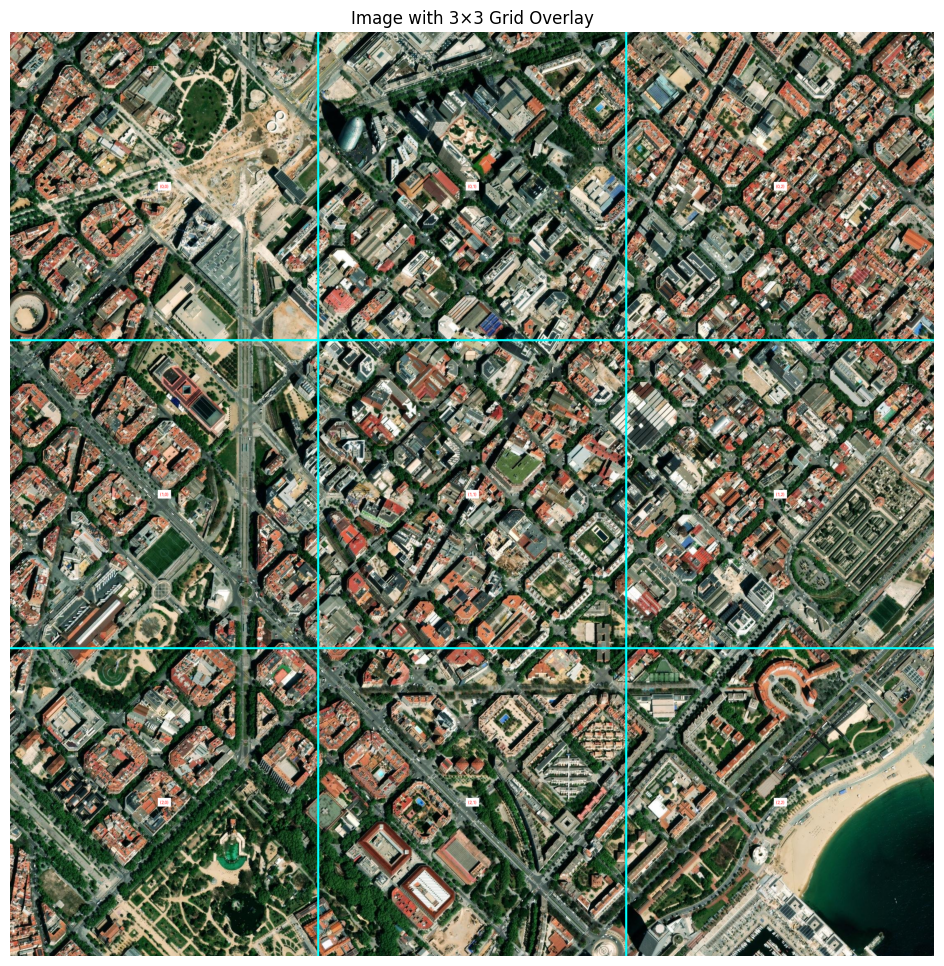

Saved tile to efficient_tiles/tile_41.396536_2.194554_r0_c0.png


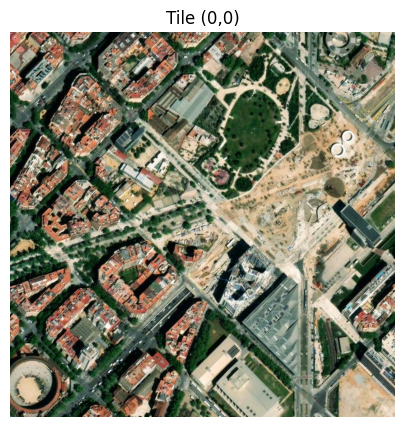

Saved tile to efficient_tiles/tile_41.396536_2.194554_r0_c1.png


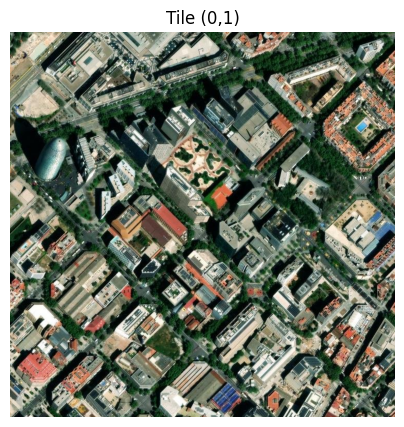

Saved tile to efficient_tiles/tile_41.396536_2.194554_r0_c2.png


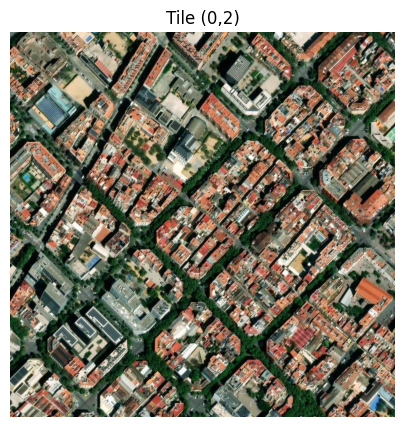

Saved tile to efficient_tiles/tile_41.396536_2.194554_r1_c0.png


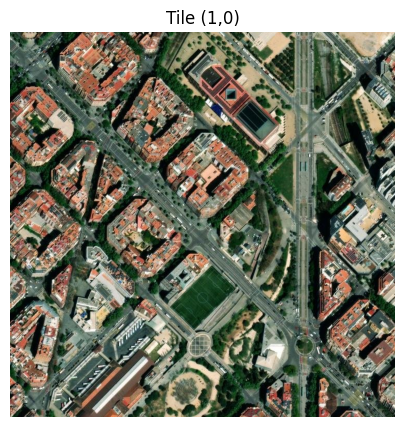

Saved tile to efficient_tiles/tile_41.396536_2.194554_r1_c1.png


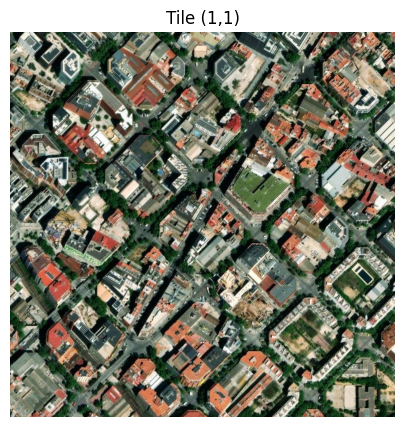

Saved tile to efficient_tiles/tile_41.396536_2.194554_r1_c2.png


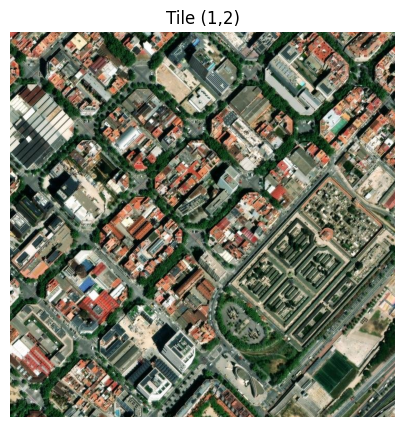

Saved tile to efficient_tiles/tile_41.396536_2.194554_r2_c0.png


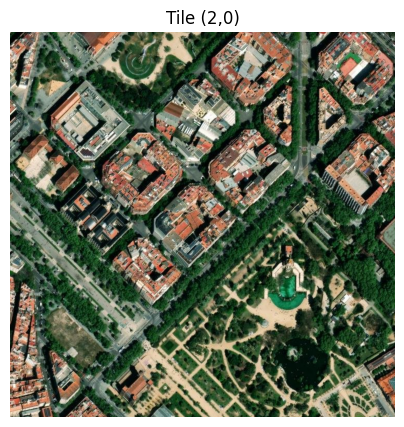

Saved tile to efficient_tiles/tile_41.396536_2.194554_r2_c1.png


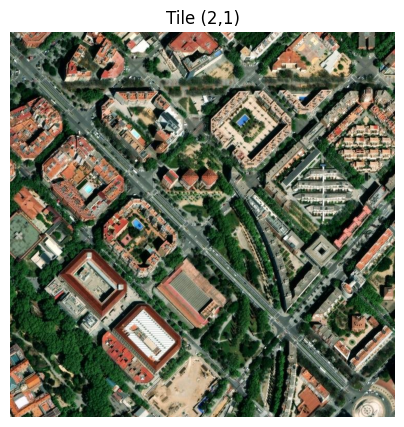

Saved tile to efficient_tiles/tile_41.396536_2.194554_r2_c2.png


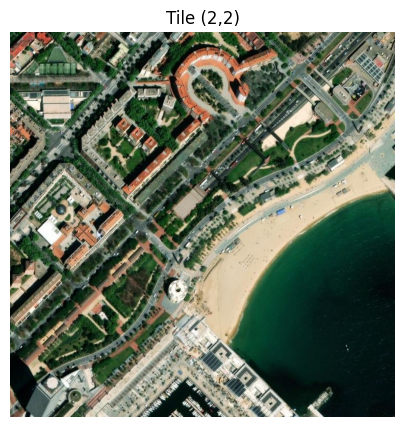

Mosaic saved to mosaic_41.396536_2.194554.png


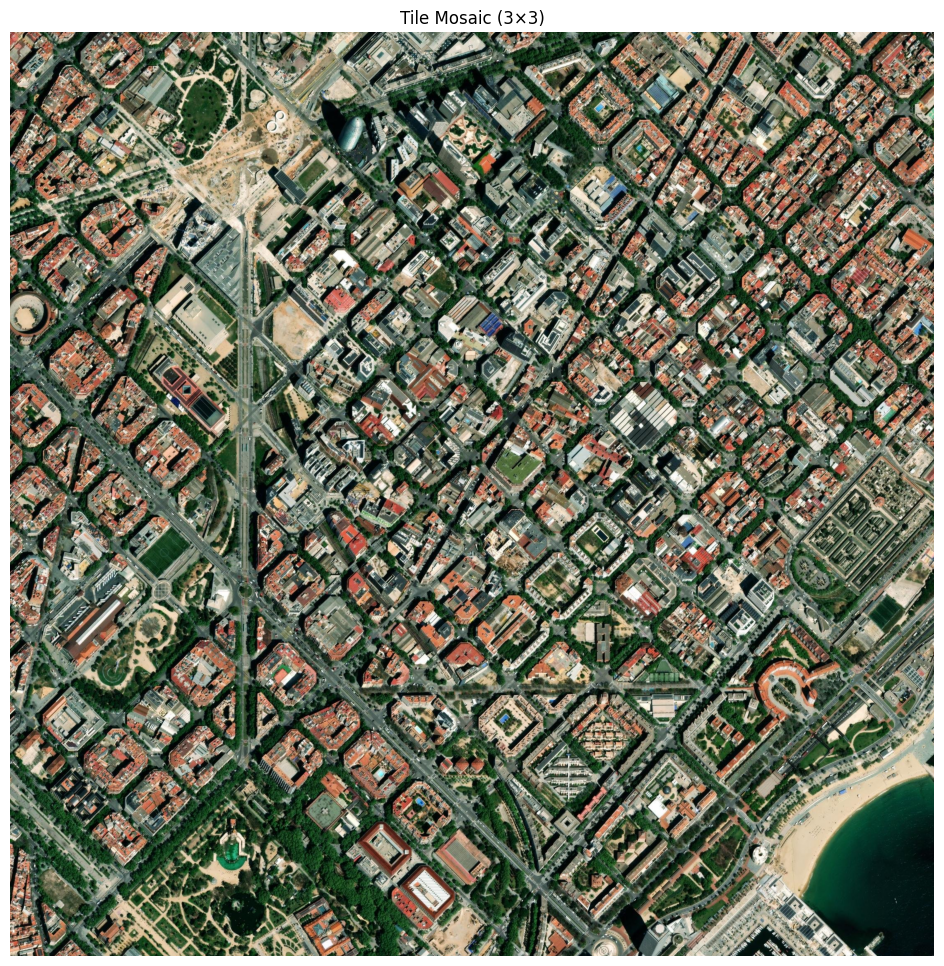

Each tile covers approximately 666.6m × 666.6m


In [ ]:
"""
Efficient Satellite Image Tile Generator
---------------------------------------
This script downloads one large satellite image and cuts it into tiles.
Much more efficient than downloading individual tiles separately.
"""

import io
import requests
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
import math
import os

def calculate_zoom_for_physical_size(lat, physical_size_meters, width_pixels=800):
    """
    Calculate appropriate zoom level for a specific physical area.

    This function determines which zoom level will display the area at
    the desired physical size with appropriate resolution.
    """
    # Earth's circumference at the equator in meters
    earth_circumference = 40075016.686

    # At zoom level 0, the entire world is 256 pixels wide
    meters_per_pixel_at_zoom_0 = earth_circumference / 256

    # Adjust for latitude (distances get smaller as you move away from equator)
    meters_per_pixel_at_lat_zoom_0 = meters_per_pixel_at_zoom_0 * np.cos(np.radians(lat))

    # Calculate how many meters each pixel needs to represent
    meters_per_pixel_needed = physical_size_meters / width_pixels

    # Calculate the zoom level where pixels will represent this physical size
    # Each zoom level doubles the detail (halves the physical size per pixel)
    zoom = np.log2(meters_per_pixel_at_lat_zoom_0 / meters_per_pixel_needed)

    # Round and clamp to valid zoom range (1-19)
    return max(1, min(19, round(zoom)))

def download_large_satellite_image(lat, lon, width_meters, height_meters, resolution, output_file=None):
    """
    Download a large satellite image covering the specified area.

    This is the main function that determines the appropriate zoom level
    and dimensions for the image, then downloads it.
    """
    # Calculate zoom level based on the larger dimension
    # This ensures we get the right level of detail
    larger_dimension_meters = max(width_meters, height_meters)
    zoom = calculate_zoom_for_physical_size(lat, larger_dimension_meters, resolution)

    # Calculate actual meters per pixel at this zoom level
    # This tells us the ground resolution of our image
    earth_circumference = 40075016.686
    meters_per_pixel = (earth_circumference * np.cos(np.radians(lat))) / (256 * (2 ** zoom))

    # Calculate required image dimensions in pixels
    # This converts our desired physical dimensions to pixel dimensions
    width_pixels = int(width_meters / meters_per_pixel)
    height_pixels = int(height_meters / meters_per_pixel)

    print(f"Downloading {width_meters}m × {height_meters}m area at zoom level {zoom}")
    print(f"Image dimensions: {width_pixels}px × {height_pixels}px")
    print(f"Resolution: {meters_per_pixel:.2f} meters per pixel")

    # Use the download function to get the actual image
    image = download_esri_satellite_image(lat, lon, width_pixels, height_pixels, zoom, output_file)

    # Return the image and actual dimensions
    # The actual dimensions might differ slightly from requested due to rounding
    actual_width_meters = width_pixels * meters_per_pixel
    actual_height_meters = height_pixels * meters_per_pixel

    return image, actual_width_meters, actual_height_meters

def download_esri_satellite_image(lat, lon, width, height, zoom, output_file=None):
    """
    Download a satellite image from ESRI World Imagery service.

    This function handles the actual downloading of tiles from the
    ESRI map service and stitches them together.
    """
    # These helper functions convert geographic coordinates to tile coordinates
    # This is how we determine which map tiles to download
    def lon_to_x(lon, zoom):
        return ((lon + 180) / 360) * (2 ** zoom)

    def lat_to_y(lat, zoom):
        lat_rad = math.radians(lat)
        return (1 - math.log(math.tan(lat_rad) + 1/math.cos(lat_rad)) / math.pi) / 2 * (2 ** zoom)

    # Calculate the center tile coordinates
    x_tile = lon_to_x(lon, zoom)
    y_tile = lat_to_y(lat, zoom)

    # Create a blank image to hold our map
    result = Image.new('RGB', (width, height))

    # Calculate the range of tiles we need to download
    # Map tiles are 256×256 pixels, so we calculate how many we need
    x_min = int(x_tile - (width / 256) / 2)
    y_min = int(y_tile - (height / 256) / 2)
    x_max = int(x_tile + (width / 256) / 2) + 1
    y_max = int(y_tile + (height / 256) / 2) + 1

    # Track download progress
    total_tiles = (x_max - x_min) * (y_max - y_min)
    tiles_downloaded = 0

    print(f"Downloading {total_tiles} map tiles...")

    # Download each tile and stitch them together
    # This loops through all the tiles we need and downloads each one
    for x in range(x_min, x_max):
        for y in range(y_min, y_max):
            # ESRI World Imagery tile URL format
            url = f"https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{zoom}/{y}/{x}"

            try:
                # Download the tile
                response = requests.get(url)
                if response.status_code == 200:
                    # Convert the response to an image
                    tile = Image.open(io.BytesIO(response.content))

                    # Calculate where to paste this tile in our result image
                    paste_x = (x - x_min) * 256
                    paste_y = (y - y_min) * 256

                    # Paste the tile into the result image
                    result.paste(tile, (paste_x, paste_y))

                    # Update progress
                    tiles_downloaded += 1
                    if tiles_downloaded % 10 == 0 or tiles_downloaded == total_tiles:
                        print(f"Downloaded {tiles_downloaded}/{total_tiles} tiles ({tiles_downloaded/total_tiles*100:.1f}%)")

            except Exception as e:
                print(f"Error downloading tile {x},{y}: {e}")

    # Crop image to exact dimensions
    # This ensures we get exactly the size we requested
    center_x = (width // 2)
    center_y = (height // 2)
    left = center_x - (width // 2)
    upper = center_y - (height // 2)
    right = center_x + (width // 2)
    lower = center_y + (height // 2)

    result = result.crop((left, upper, right, lower))

    # Save if output file specified
    if output_file:
        result.save(output_file)
        print(f"Large image saved to {output_file}")

    return result

def add_grid_overlay(image, rows, cols, output_file=None):
    """
    Add a grid overlay to an image with row and column labels.

    This function adds a visual grid showing how the image will be divided,
    with coordinates for each tile.
    """
    # Create a copy of the image to draw on
    overlay_image = image.copy().convert('RGBA')
    draw = ImageDraw.Draw(overlay_image)

    # Get image dimensions
    width, height = image.size

    # Calculate tile dimensions
    tile_width = width // cols
    tile_height = height // rows

    # Draw vertical grid lines
    for i in range(1, cols):
        x = i * tile_width
        draw.line([(x, 0), (x, height)], fill=(0, 255, 255, 180), width=5)

    # Draw horizontal grid lines
    for i in range(1, rows):
        y = i * tile_height
        draw.line([(0, y), (width, y)], fill=(0, 255, 255, 180), width=5)

    # Draw tile labels
    try:
        # Try to use a TrueType font if available
        font = ImageFont.truetype("arial.ttf", 40)
    except IOError:
        # Fallback to default font
        font = ImageFont.load_default()

    for row in range(rows):
        for col in range(cols):
            # Calculate center of the tile
            center_x = col * tile_width + tile_width // 2
            center_y = row * tile_height + tile_height // 2

            # Draw tile label
            label = f"({row},{col})"

            # Get text size
            try:
                text_bbox = draw.textbbox((0, 0), label, font=font)
                text_width = text_bbox[2] - text_bbox[0]
                text_height = text_bbox[3] - text_bbox[1]
            except AttributeError:
                # For older Pillow versions
                text_width, text_height = draw.textsize(label, font=font)

            # Position the text in the center of the tile
            text_x = center_x - text_width // 2
            text_y = center_y - text_height // 2

            # Draw white rectangle behind text for better visibility
            padding = 5
            draw.rectangle(
                [
                    text_x - padding,
                    text_y - padding,
                    text_x + text_width + padding,
                    text_y + text_height + padding
                ],
                fill=(255, 255, 255, 180)  # Semi-transparent white
            )

            # Draw the text
            draw.text((text_x, text_y), label, fill=(255, 0, 0), font=font)

    # Convert back to RGB for compatibility
    overlay_image = overlay_image.convert('RGB')

    # Save the image if output file specified
    if output_file:
        overlay_image.save(output_file)
        print(f"Grid overlay image saved to {output_file}")

    # Display the image
    plt.figure(figsize=(12, 12))
    plt.imshow(overlay_image)
    plt.title(f"Image with {rows}×{cols} Grid Overlay")
    plt.axis('off')
    plt.show()

    return overlay_image

def cut_image_into_tiles(image, rows, cols, output_dir=None, base_filename="tile"):
    """
    Cut a single large image into a grid of smaller tiles.

    This function takes the downloaded image and divides it into
    the requested number of smaller tile images.
    """
    # Calculate the dimensions of each tile
    width, height = image.size
    tile_width = width // cols
    tile_height = height // rows

    tiles = []

    # Create output directory if needed
    if output_dir and not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Cut image into tiles
    # We loop through each row and column, creating a tile for each position
    for row in range(rows):
        for col in range(cols):
            # Calculate tile boundaries in pixels
            left = col * tile_width
            upper = row * tile_height
            right = left + tile_width
            lower = upper + tile_height

            # Crop the tile from the large image
            tile = image.crop((left, upper, right, lower))
            tiles.append(tile)

            # Save the tile if directory specified
            if output_dir:
                tile_filename = f"{base_filename}_r{row}_c{col}.png"
                tile_path = os.path.join(output_dir, tile_filename)
                tile.save(tile_path)
                print(f"Saved tile to {tile_path}")

            # Display the tile
            plt.figure(figsize=(5, 5))
            plt.imshow(tile)
            plt.title(f"Tile ({row},{col})")
            plt.axis('off')
            plt.show()

    return tiles

def create_tile_mosaic(tiles, rows, cols, output_file=None):
    """
    Create a mosaic image from tiles (for visualization).

    This function reassembles the tiles into a single image to verify
    that they fit together correctly.
    """
    # Verify we have the correct number of tiles
    if len(tiles) != rows * cols:
        raise ValueError(f"Expected {rows*cols} tiles, got {len(tiles)}")

    # Get tile dimensions from the first tile
    tile_width, tile_height = tiles[0].size

    # Create a new blank image for the mosaic
    mosaic = Image.new('RGB', (cols * tile_width, rows * tile_height))

    # Paste each tile into the mosaic
    for i, tile in enumerate(tiles):
        # Calculate the row and column from the tile index
        row = i // cols
        col = i % cols

        # Paste the tile at the correct position
        mosaic.paste(tile, (col * tile_width, row * tile_height))

    # Save the mosaic if requested
    if output_file:
        mosaic.save(output_file)
        print(f"Mosaic saved to {output_file}")

    # Display the mosaic
    plt.figure(figsize=(12, 12))
    plt.imshow(mosaic)
    plt.title(f"Tile Mosaic ({rows}×{cols})")
    plt.axis('off')
    plt.show()

    return mosaic

def get_tiles_from_large_image(lat, lon, area_size_meters, grid_size, resolution=2048, output_dir=None, output_file=None):
    """
    Download a large satellite image and cut it into tiles.

    This is the main function that combines all the steps - downloading,
    previewing, and cutting into tiles.
    """
    rows, cols = grid_size

    # Handle area size parameter
    # Allow either a single value (square) or separate width/height
    if isinstance(area_size_meters, (int, float)):
        width_meters = height_meters = area_size_meters
    else:
        width_meters, height_meters = area_size_meters

    # Generate default output file name if not provided
    if output_file is None:
        output_file = f"satellite_{lat}_{lon}_{width_meters}x{height_meters}m.png"

    # Download the large image
    large_image, actual_width, actual_height = download_large_satellite_image(
        lat, lon, width_meters, height_meters, resolution, output_file
    )

    print(f"Actual area covered: {actual_width:.1f}m × {actual_height:.1f}m")

    # Create a preview with grid overlay
    grid_preview = add_grid_overlay(
        large_image, rows, cols,
        output_file=output_file.replace('.png', '_grid_preview.png')
    )

    # Cut the image into tiles
    base_filename = f"tile_{lat}_{lon}"
    tiles = cut_image_into_tiles(large_image, rows, cols, output_dir, base_filename)

    # Create a mosaic for visualization
    mosaic = create_tile_mosaic(tiles, rows, cols, f"mosaic_{lat}_{lon}.png")

    # Calculate and display the physical size of each tile
    tile_width_meters = actual_width / cols
    tile_height_meters = actual_height / rows
    print(f"Each tile covers approximately {tile_width_meters:.1f}m × {tile_height_meters:.1f}m")

    return large_image, tiles

# Example usage
def example_efficient_tiling():
    """
    Example function showing how to use the tile generator.

    This downloads a 2km x 2km area around Barcelona and cuts it into a 3x3 grid.
    """
    # Barcelona coordinates
    lat = 41.396536
    lon = 2.194554

    # Download a 2km x 2km area and cut it into a 3x3 grid
    get_tiles_from_large_image(
        lat=lat,
        lon=lon,
        area_size_meters=2000,  # 2km x 2km area
        grid_size=(3, 3),       # 3x3 grid = 9 tiles
        resolution=3000,        # Resolution parameter for large image
        output_dir="efficient_tiles",  # Directory to save tiles
        output_file="barcelona_large_2km.png"  # Filename for large image
    )

# Run the example when the script is executed directly
if __name__ == "__main__":
    example_efficient_tiling()

Available Models:
(https://github.com/satellite-image-deep-learning/techniques?tab=readme-ov-file)